# Mandible X-ray

In [1]:
import os
import skimage
import cv2 as cv
import scipy as sp
import numpy as np
import pandas as pd
import tensorflow as tf 
import matplotlib.pyplot as plt

2024-05-23 19:42:48.435957: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-23 19:42:49.185671: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Loading X-ray Image

In [2]:
case_numbers = [
    "0103924",
    "0104607",
    "0206378",
    "0413594",
    "0613818",
    "0701332",
    "0714572",
    "0808121",
    "0810504",
    "0900476",
    "1510906", # low contrast
    "1509982", # unclear pin
]

image_index = 1
image_path = os.path.join(os.getcwd(), "..", "..", "dataset", "annotations2")
measurement = list(filter(lambda f: f.split(".")[1] == "xlsx", os.listdir(image_path)))[0]
df = pd.read_excel(os.path.join(image_path, measurement))

In [3]:
img_without_annotation = cv.imread(os.path.join(image_path, f"{case_numbers[image_index]}-1.tiff"))
img_with_annotation = cv.imread(os.path.join(image_path, f"{case_numbers[image_index]}-2.tiff"))

# Convert image color space from BGR to RGB
gray_without_annotation = cv.cvtColor(img_without_annotation, cv.COLOR_BGR2GRAY)
img_with_annotation = cv.cvtColor(img_with_annotation, cv.COLOR_BGR2RGB)

### Load Kimberly's CNN Model

In [4]:
model = tf.keras.models.load_model("../../dataset/augmented/unet-cnn.keras")

2024-05-23 19:42:50.447300: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-23 19:42:50.469216: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [5]:
model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 300, 130,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_166 (Conv2D) │ (None, 300, 130,  │      1,792 │ input_layer_14[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 300, 130,  │        256 │ conv2d_166[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_155      │ (None, 300, 130,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_167 (Conv2D) │ (None, 300, 130,  │     36,928 │ activation_155[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 300, 130,  │        256 │ conv2d_167[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_156      │ (None, 300, 130,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_48    │ (None, 150, 65,   │          0 │ activation_156[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_168 (Conv2D) │ (None, 150, 65,   │     73,856 │ max_pooling2d_48… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 150, 65,   │        512 │ conv2d_168[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_157      │ (None, 150, 65,   │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_169 (Conv2D) │ (None, 150, 65,   │    147,584 │ activation_157[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 150, 65,   │        512 │ conv2d_169[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_158      │ (None, 150, 65,   │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_49    │ (None, 75, 32,    │          0 │ activation_158[0… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_170 (Conv2D) │ (None, 75, 32,    │    295,168 │ max_pooling2d_49… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 32,    │      1,024 │ conv2d_170[0][0]

 Total params: 94,183,941 (359.28 MB)

 Trainable params: 31,390,721 (119.75 MB)

 Non-trainable params: 11,776 (46.00 KB)

 Optimizer params: 62,781,444 (239.49 MB)

In [6]:
img_resized = cv.resize(img_without_annotation, (130, 300))
normalized_img_resized = np.expand_dims(img_resized / 255.0, axis=0)

In [7]:
pred = model.predict(normalized_img_resized)
result_mask = pred[0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 812ms/step


#### Function to display images (for convenient)

In [8]:
def display_image(img: cv.Mat, title: str = "", figsize: tuple[int, int] = (10, 5), axis: bool = False) -> None:
    plt.figure(figsize=figsize)
    
    if len(title) > 0:
        plt.title(title)
    
    if not axis:
        plt.axis("off")
    
    plt.imshow(img, cmap="gray")
    plt.show()
    
def display_images(img1: cv.Mat, img2: cv.Mat, title1: str = "", title2: str = "", figsize: tuple[int, int] = (20, 10), axis: bool = False) -> None:
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    
    if len(title1) > 0:
        axes[0].set_title(title1)
        
    if len(title2) > 0:
        axes[1].set_title(title2)
    
    if not axis:
        axes[0].axis("off")
        axes[1].axis("off")
    
    axes[0].imshow(img1, cmap="gray")
    axes[1].imshow(img2, cmap="gray")
    
    fig.tight_layout()

### Process predicted mask

In [9]:
reshaped_pred = pred.reshape((130, 300))

result_mask[result_mask <=0.5] = 0
result_mask[result_mask > 0.5] = 255

w = int(img_without_annotation.shape[1])
h = int(img_without_annotation.shape[0])

dim = (w, h)

img = cv.resize(img_without_annotation, dim, interpolation = cv.INTER_AREA)
mask = cv.resize(result_mask, dim, interpolation = cv.INTER_AREA)

In [10]:
blur_mask = cv.GaussianBlur(mask, (303, 303), 30).astype(np.uint8)
blur_mask[blur_mask > 127.5] = 255
blur_mask[blur_mask <= 127.5] = 0

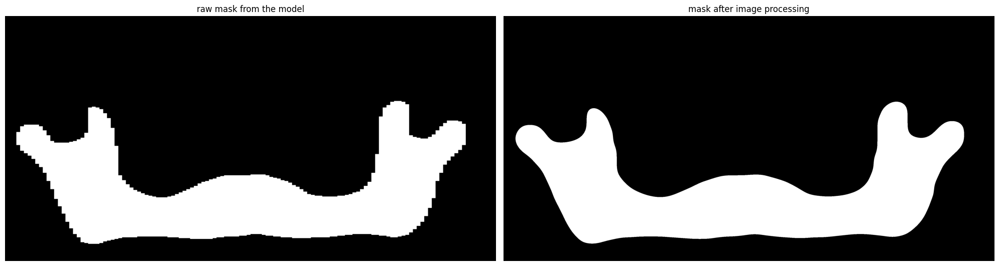

In [11]:
display_images(mask, blur_mask, "raw mask from the model", "mask after image processing")

In [12]:
mask_edge = cv.Canny(blur_mask, 125, 200)
contours, _ = cv.findContours(mask_edge, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
img_pred = cv.drawContours(img_without_annotation.copy(), contours[0], -1, (255, 0, 0), 3)

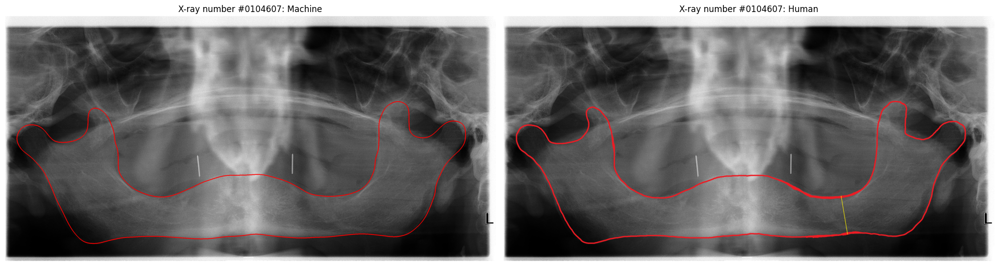

In [13]:
display_images(
    img_pred, 
    img_with_annotation, 
    f"X-ray number #{case_numbers[image_index]}: Machine", 
    f"X-ray number #{case_numbers[image_index]}: Human"
)

In [14]:
def get_region_of_interest(mask_contours: tuple[np.array]) -> tuple[int, int, int, int]:
    flatten = mask_contours[0].reshape(mask_contours[0].shape[0], mask_contours[0].shape[-1])
    min_x, max_x, min_y, max_y = flatten.T[0].min(), flatten.T[0].max(), flatten.T[1].min(), flatten.T[1].max()
    
    return min_x, max_x, min_y, max_y

In [15]:
min_x, max_x, min_y, max_y = get_region_of_interest(contours)

region_of_interest = gray_without_annotation[min_y:max_y, min_x:max_x]

In [16]:
def get_img_grid(img: cv.Mat, n_row: int, n_col: int) -> np.array:
    width, height = img.shape[1], img.shape[0]
    
    width = width if width % 2 == 0 else width - 1
    height = height if height % 2 == 0 else height - 1
    
    grid = []
    
    grid_width, grid_height = width // n_row, height // n_col
    
    for y in range(1, n_col + 1):
        inner_grid = []
        
        for x in range(1, n_row + 1):
            inner_grid.append(img[grid_height * (y - 1):grid_height * y, grid_width * (x - 1):grid_width * x])
        
        np_inner_grid = np.array(inner_grid)
        grid.append(np_inner_grid)
        
    return np.array(grid)

In [17]:
def display_grid_images(grid: np.array, gray: bool = False, axis: bool = False) -> None:
    fig, axes = plt.subplots(nrows=grid.shape[0], ncols=grid.shape[1], figsize=(20, 10))
    
    for i in range(0, grid.shape[1]):
        for j in range(0, grid.shape[0]):
            if gray:
                axes[j][i].imshow(grid[j][i], cmap="gray")
            else:
                axes[j][i].imshow(grid[j][i])
            
            if not axis:
                axes[j][i].axis("off")
    
    fig.tight_layout()

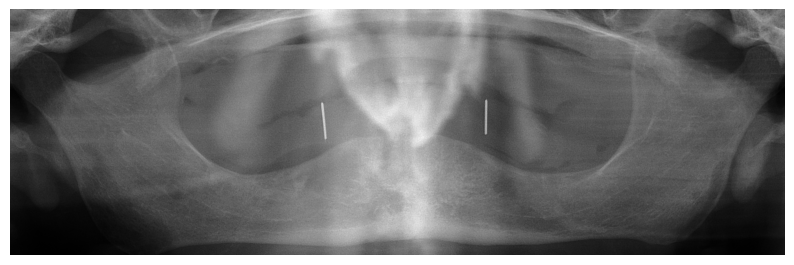

In [18]:
display_image(region_of_interest)

In [19]:
grid = get_img_grid(region_of_interest, 12, 3)

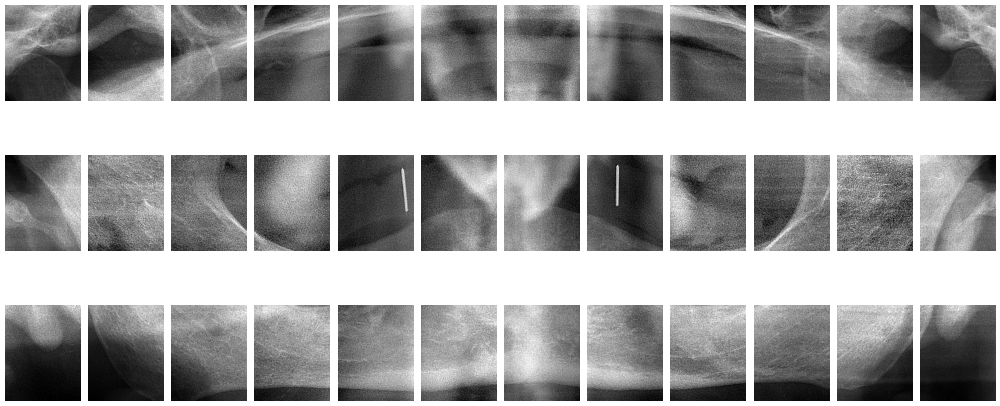

In [20]:
display_grid_images(grid, gray=True)

In [21]:
def mark_possible_pin_location(grid: np.array) -> np.array:
    grid_copy = []
    
    for i in range(grid.shape[0]):
        inner_grid_copy = []
        for j in range(3, grid.shape[1] - 3):
            img_copy = skimage.exposure.equalize_adapthist(grid[i][j])
            left = skimage.filters.apply_hysteresis_threshold(skimage.filters.scharr_v(img_copy), 0.05, 0.1)
            right = skimage.filters.apply_hysteresis_threshold(skimage.filters.scharr_v(img_copy[:, ::-1]), 0.05, 0.1)
            
            left_edges = left
            right_edges = right[:, ::-1]
            
            left_edges = left_edges.astype(np.uint8)
            left_edges[left_edges > 0] = 255
            
            right_edges = right_edges.astype(np.uint8)
            right_edges[right_edges > 0] = 255
            
            left_contours, _ = cv.findContours(left_edges, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
            right_contours, _ = cv.findContours(right_edges, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
                        
            vertical_edges = left_edges | right_edges
            vertical_edges = cv.cvtColor(vertical_edges, cv.COLOR_GRAY2RGB)
            
            for left_contour in left_contours:
                if len(left_contour) > 150:
                    for right_contour in right_contours:
                        if len(right_contour) > 150:
                            right = right_contour.reshape(right_contour.shape[0], right_contour.shape[-1])
                            left = left_contour.reshape(left_contour.shape[0], left_contour.shape[-1])
                            
                            for left_y, left_x in left:
                                cv.circle(vertical_edges, (left_y, left_x), 1, (255, 0, 0), 1)
                            
                            for right_y, right_x in right:
                                cv.circle(vertical_edges, (right_y, right_x), 1, (0, 255, 0), 1)
                        else:
                            continue
                else:
                    continue
            
            inner_grid_copy.append(vertical_edges)
        grid_copy.append(np.array(inner_grid_copy))
    return np.array(grid_copy)

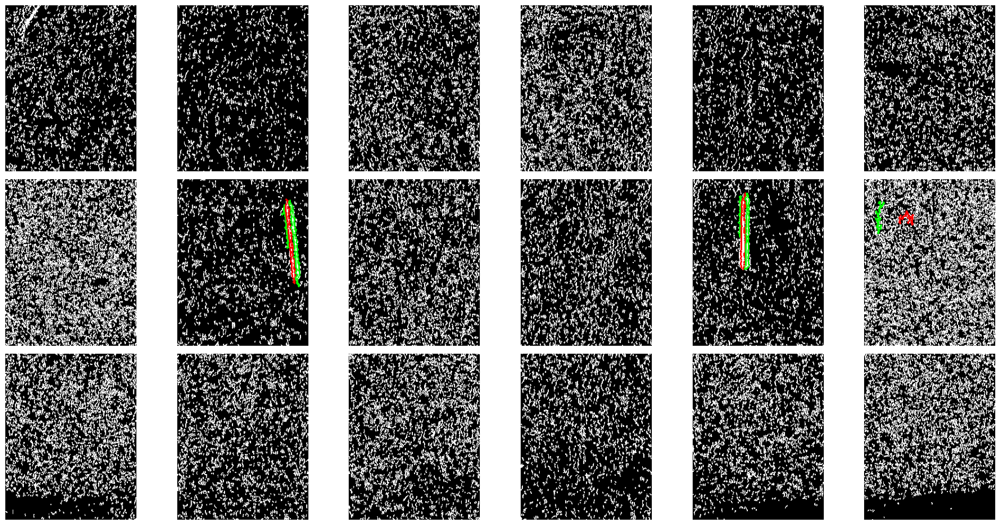

In [22]:
masked_grid = mark_possible_pin_location(grid)
display_grid_images(masked_grid)

In [23]:
def filter_possibility(grid: np.array):
    grid_coordinates = []
    width, height = grid.shape[3], grid.shape[2]
    grid_copy = grid.copy()
    for i in range(grid.shape[0]):
        inner_grid = []
        for j in range(grid.shape[1]):
            hsv_img = cv.cvtColor(grid_copy[i][j], cv.COLOR_BGR2HSV)
            mask_img = cv.inRange(hsv_img, (1, 1, 0), (255, 255, 255))
            rgb_img = cv.cvtColor(hsv_img, cv.COLOR_HSV2BGR)
            result = cv.bitwise_or(rgb_img, rgb_img, mask=mask_img.astype(np.uint8))
            points = np.argwhere(result > 0)
            coords = []
            if points.shape[0] > 0:
                for point in points:
                    y, x, _ = point
                    radius = 10
                    right = width if (x + radius) >= width else x + radius
                    left = 0 if (x - radius) < 0 else x - radius
                    
                    if np.argwhere(result[y, left:right, :] == 255).shape[0] > 0:
                        if result[y, x, 0] == 255 and result[y, x, 1] == 0 and result[y, x, 2] == 0:
                            if np.argwhere(result[y, left:right, 1] == 255).shape[0] > 0:
                                coords.append(np.array([x, y]))
                        else:
                            if np.argwhere(result[y, left:right, 0] == 255).shape[0] > 0:
                                coords.append(np.array([x, y]))
                                
            inner_grid.append(coords)
            
        grid_coordinates.append(inner_grid)
        
    return grid_coordinates
                

In [24]:
filtered_masked_grid = filter_possibility(masked_grid)

In [25]:
def get_pin_boundaries(grid: np.array, pin_location: list, roi_offset_x: int, roi_offset_y: int, padding: int = 200):
    pins = []
    width, height = grid.shape[-1], grid.shape[-2]
    
    for i in range(len(pin_location)):
        for j in range(len(pin_location[i])):
            coords = pin_location[i][j]
            coords_t = np.array(coords).T
            
            if coords_t.shape[0] > 0:
                grid_offset_x = width * (j + 3) + roi_offset_x
                grid_offset_y = height + roi_offset_y
                
                min_x, max_x = coords_t[0].min() + grid_offset_x - padding, coords_t[0].max() + grid_offset_x + padding
                min_y, max_y = coords_t[1].min() + grid_offset_y - padding, coords_t[1].max() + grid_offset_y + padding
                
                pins.append([min_x, max_x, min_y, max_y])
    
    return pins

In [26]:
pins = get_pin_boundaries(grid, filtered_masked_grid, min_x, min_y)

In [27]:
left_pin, right_pin = pins

In [28]:
cropped_left_pin = gray_without_annotation[left_pin[2]:left_pin[3], left_pin[0]:left_pin[1]]
cropped_right_pin = gray_without_annotation[right_pin[2]:right_pin[3], right_pin[0]:right_pin[1]]

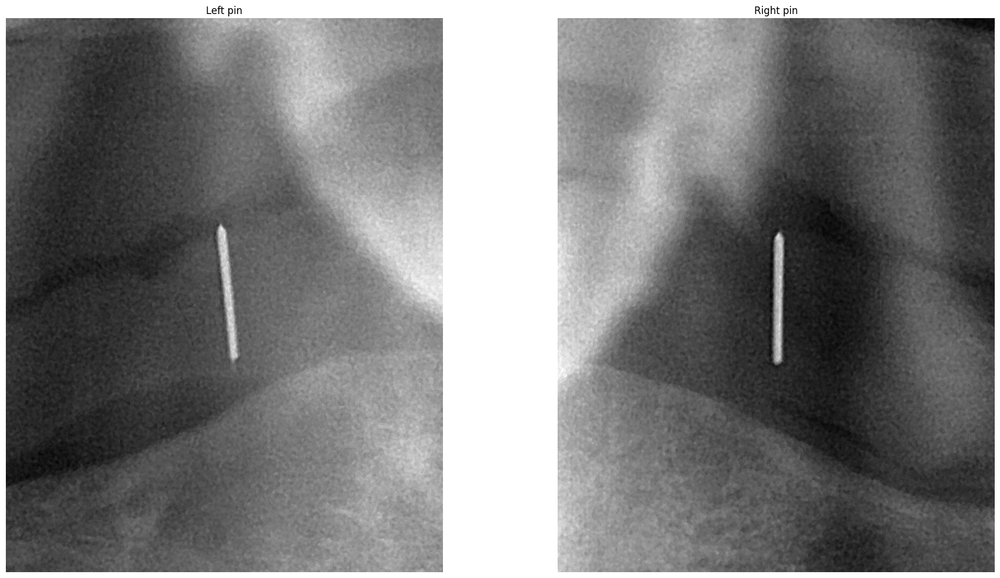

In [29]:
display_images(cropped_left_pin, cropped_right_pin, "Left pin", "Right pin")

In [30]:
clahe_left = skimage.exposure.equalize_adapthist(cropped_left_pin)
clahe_right = skimage.exposure.equalize_adapthist(cropped_right_pin)

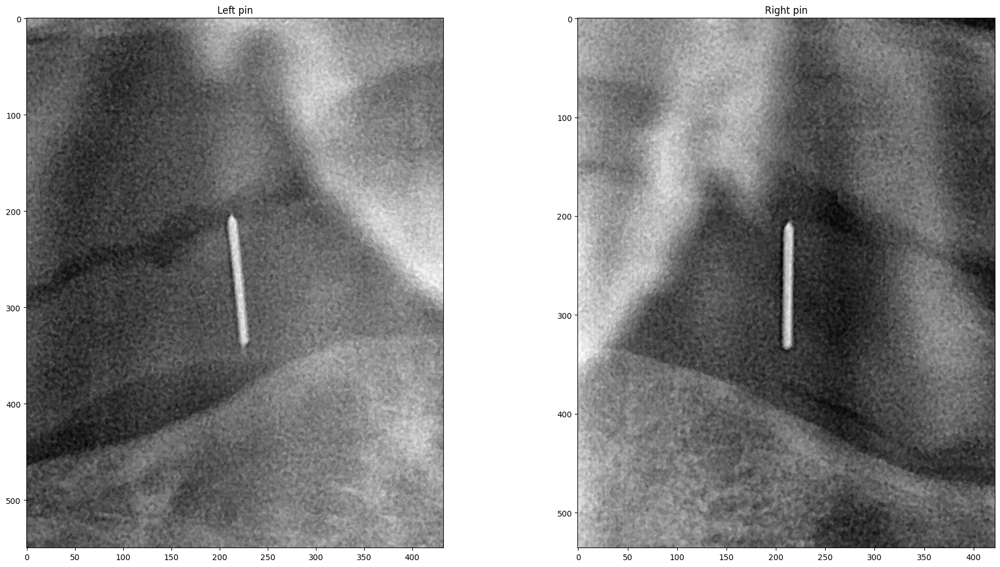

In [31]:
display_images(clahe_left, clahe_right, "Left pin", "Right pin", axis=True)

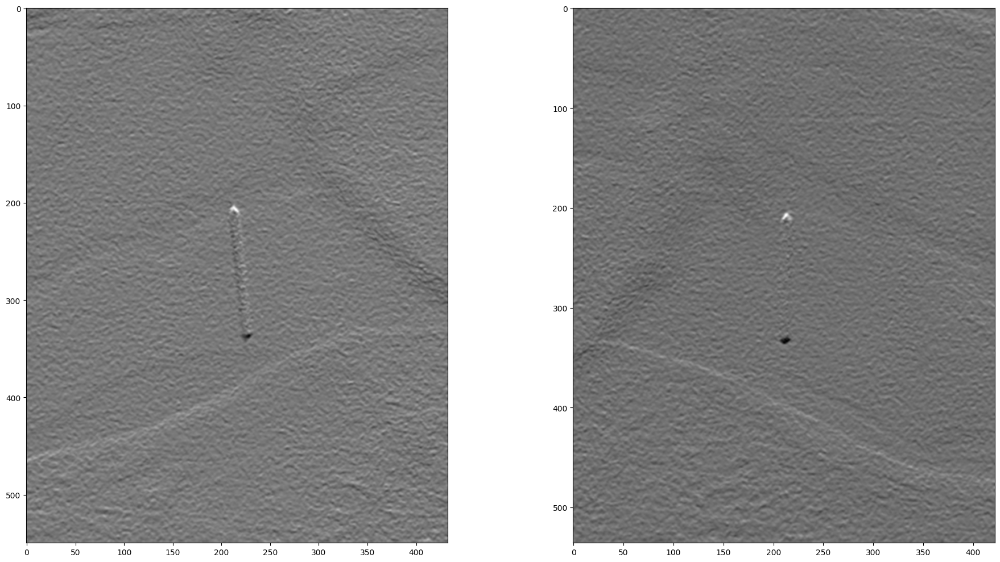

In [32]:
farid_left_h = skimage.filters.farid_h(cropped_left_pin)
farid_right_h = skimage.filters.farid_h(cropped_right_pin)

display_images(farid_left_h, farid_right_h, axis=True)

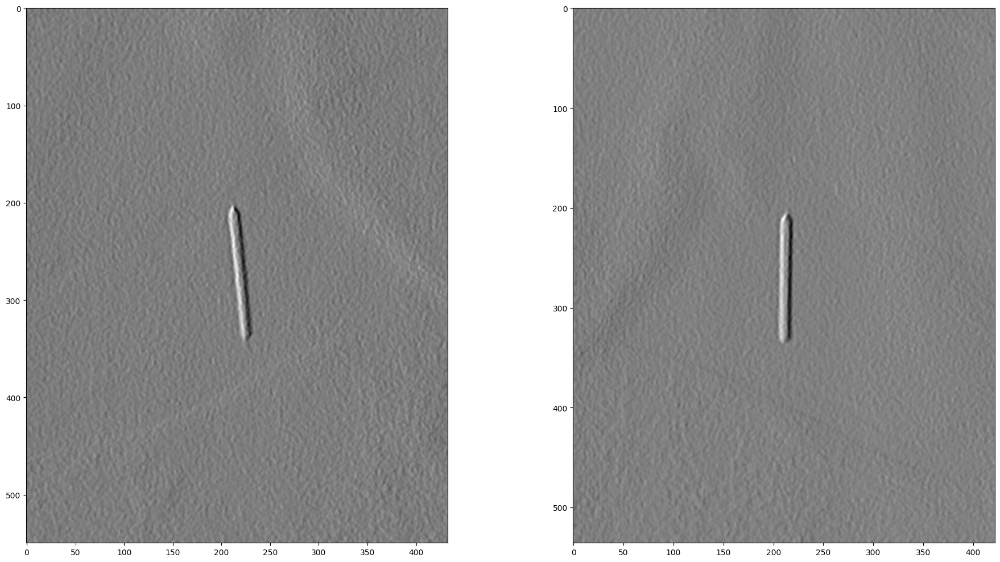

In [33]:
farid_left_v = skimage.filters.farid_v(cropped_left_pin)
farid_right_v = skimage.filters.farid_v(cropped_right_pin)

display_images(farid_left_v, farid_right_v, axis=True)

In [34]:
left_pin_h_min, left_pin_h_max = farid_left_h.min(), farid_left_h.max()
right_pin_h_min, right_pin_h_max = farid_right_h.min(), farid_right_h.max()

In [35]:
left_pin_top = skimage.filters.apply_hysteresis_threshold(farid_left_h, left_pin_h_max  - 0.05, left_pin_h_max - 0.01)
left_pin_bottom = ~skimage.filters.apply_hysteresis_threshold(farid_left_h, left_pin_h_min + 0.05, left_pin_h_min + 0.1)

right_pin_top = skimage.filters.apply_hysteresis_threshold(farid_right_h, right_pin_h_max  - 0.05, right_pin_h_max - 0.01)
right_pin_bottom = ~skimage.filters.apply_hysteresis_threshold(farid_right_h, right_pin_h_min + 0.05, right_pin_h_min + 0.1)

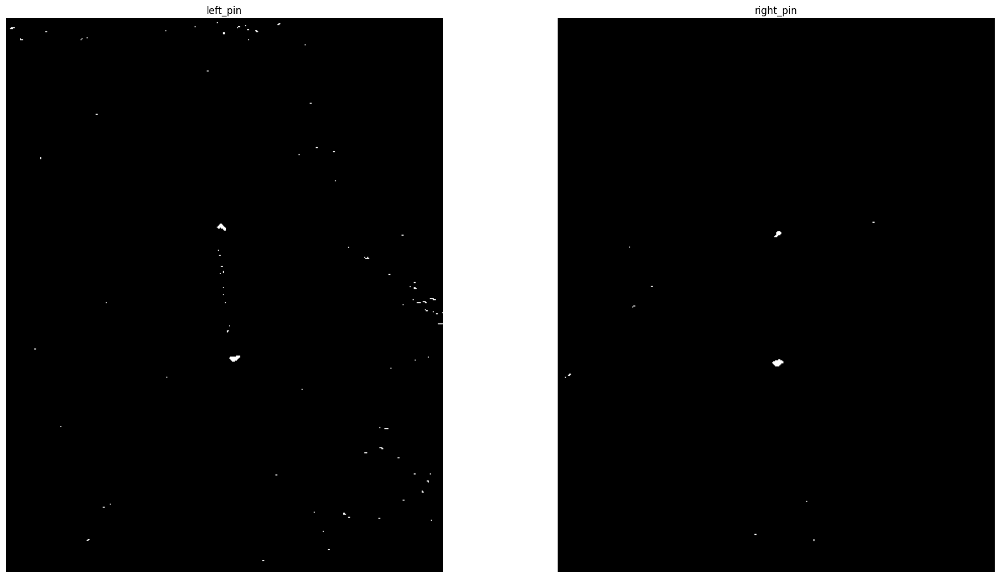

In [36]:
display_images(left_pin_top | left_pin_bottom, right_pin_top | right_pin_bottom, "left_pin", "right_pin")

In [37]:
left_pin_v_min, left_pin_v_max = farid_left_v.min(), farid_left_v.max()
right_pin_v_min, right_pin_v_max = farid_right_v.min(), farid_right_v.max()

In [38]:
left_pin_left = skimage.filters.apply_hysteresis_threshold(farid_left_v, left_pin_v_max  - 0.05, left_pin_v_max - 0.01)
left_pin_right = ~skimage.filters.apply_hysteresis_threshold(farid_left_v, left_pin_v_min + 0.05, left_pin_v_min + 0.1)

right_pin_left = skimage.filters.apply_hysteresis_threshold(farid_right_v, right_pin_v_max  - 0.05, right_pin_v_max - 0.01)
right_pin_right = ~skimage.filters.apply_hysteresis_threshold(farid_right_v, right_pin_v_min + 0.05, right_pin_v_min + 0.1)

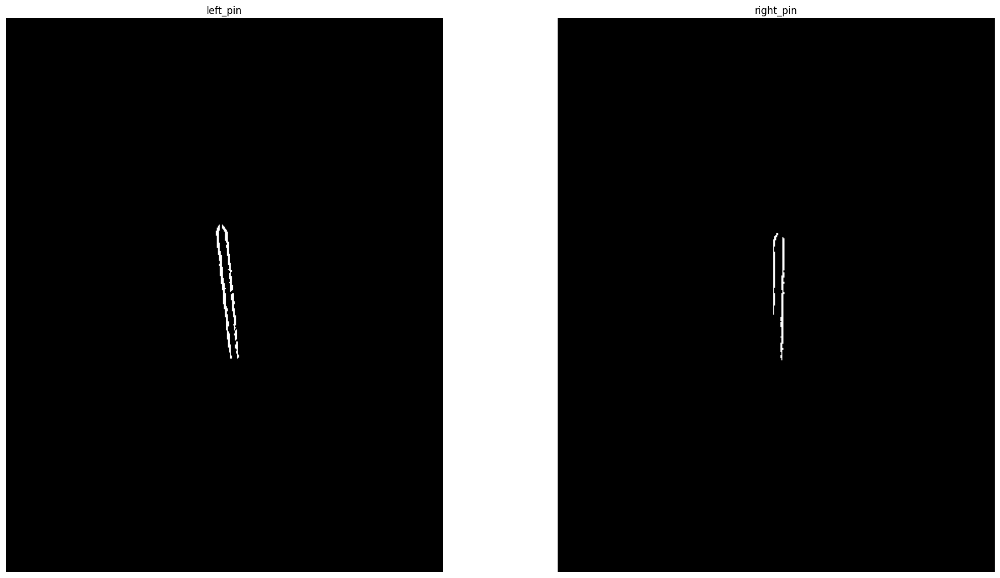

In [39]:
display_images(left_pin_left | left_pin_right, right_pin_left | right_pin_right, "left_pin", "right_pin")

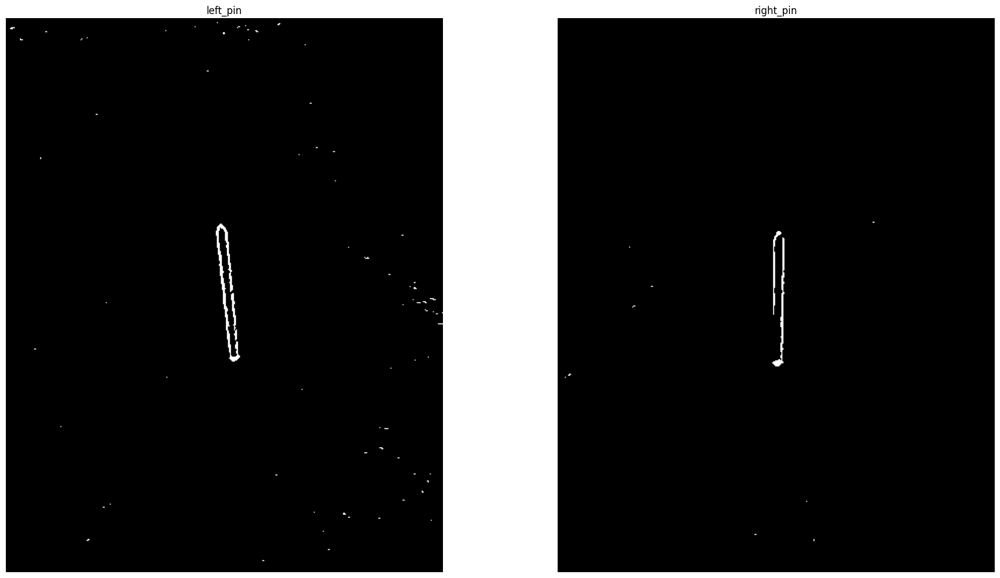

In [40]:
display_images(
    left_pin_left | left_pin_right | left_pin_top | left_pin_bottom, 
    right_pin_left | right_pin_right | right_pin_top | right_pin_bottom,
    "left_pin", "right_pin"
)

In [41]:
def get_pin_point(left_pin_left, left_pin_right, left_pin_top, left_pin_bottom, right_pin_left, right_pin_right, right_pin_top, right_pin_bottom):
    top_left, bottom_left, top_right, bottom_right = [], [], [], []
    
    radius_x = 30
    radius_y = 50
    
    for y in range(left_pin_top.shape[0]):
        top_points = np.argwhere(left_pin_top[y, :] > 0).flatten()
        if top_points.shape[0] > 0:
            for x in top_points:
                h_radius_left = 0 if x - radius_x < 0 else x - radius_x
                h_radius_right = left_pin_left.shape[0] if x + radius_x > left_pin_left.shape[0] else x + radius_x
                
                v_radius_top = 0 if y - radius_y < 0 else y - radius_y
                v_radius_bottom = left_pin_left.shape[1] if y + radius_y > left_pin_left.shape[0] else y + radius_y
                
                t1 = np.argwhere(left_pin_left[v_radius_top:v_radius_bottom, h_radius_left:h_radius_right] == True)
                t2 = np.argwhere(left_pin_right[v_radius_top:v_radius_bottom, h_radius_left:h_radius_right] == True)
                
                if t1.shape[0] > 0 and t2.shape[0] > 0:
                    top_left.append(np.array([x, y]))
    
    for y in range(left_pin_top.shape[0] - 1, 0, -1):
        bottom_points = np.argwhere(left_pin_bottom[y, :] > 0).flatten()
        if bottom_points.shape[0] > 0:
            for x in bottom_points:
                h_radius_left = 0 if x - radius_x < 0 else x - radius_x
                h_radius_right = left_pin_left.shape[0] if x + radius_x > left_pin_left.shape[0] else x + radius_x
                
                v_radius_top = 0 if y - radius_y < 0 else y - radius_y
                v_radius_bottom = left_pin_left.shape[1] if y + radius_y > left_pin_left.shape[0] else y + radius_y
                
                t1 = np.argwhere(left_pin_left[v_radius_top:v_radius_bottom, h_radius_left:h_radius_right] == True)
                t2 = np.argwhere(left_pin_right[v_radius_top:v_radius_bottom, h_radius_left:h_radius_right] == True)
                
                
                if t1.shape[0] > 0 and t2.shape[0] > 0:
                    bottom_left.append(np.array([x, y]))
    
    for y in range(right_pin_top.shape[0]):
        top_points = np.argwhere(right_pin_top[y, :] > 0).flatten()
        if top_points.shape[0] > 0:
            for x in top_points:
                h_radius_left = 0 if x - radius_x < 0 else x - radius_x
                h_radius_right = right_pin_left.shape[0] if x + radius_x > right_pin_left.shape[0] else x + radius_x
                
                v_radius_top = 0 if y - radius_y < 0 else y - radius_y
                v_radius_bottom = right_pin_left.shape[1] if y + radius_y > right_pin_left.shape[0] else y + radius_y
                
                t1 = np.argwhere(right_pin_left[v_radius_top:v_radius_bottom, h_radius_left:h_radius_right] == True)
                t2 = np.argwhere(right_pin_right[v_radius_top:v_radius_bottom, h_radius_left:h_radius_right] == True)
                
                if t1.shape[0] > 0 and t2.shape[0] > 0:
                    top_right.append(np.array([x, y]))
    
    for y in range(right_pin_top.shape[0] - 1, 0, -1):
        bottom_points = np.argwhere(right_pin_bottom[y, :] > 0).flatten()
        if bottom_points.shape[0] > 0:
            for x in bottom_points:
                h_radius_left = 0 if x - radius_x < 0 else x - radius_x
                h_radius_right = right_pin_left.shape[0] if x + radius_x > right_pin_left.shape[0] else x + radius_x
                
                v_radius_top = 0 if y - radius_y < 0 else y - radius_y
                v_radius_bottom = right_pin_left.shape[1] if y + radius_y > right_pin_left.shape[0] else y + radius_y
                
                t1 = np.argwhere(right_pin_left[v_radius_top:v_radius_bottom, h_radius_left:h_radius_right] == True)
                t2 = np.argwhere(right_pin_right[v_radius_top:v_radius_bottom, h_radius_left:h_radius_right] == True)
                
                
                if t1.shape[0] > 0 and t2.shape[0] > 0:
                    bottom_right.append(np.array([x, y]))
    
    top_left, bottom_left, top_right, bottom_right = np.array(top_left), np.array(bottom_left), np.array(top_right), np.array(bottom_right)
    
    top_left_mid = top_left.T[0].mean().round().astype(np.int32)
    top_left_index = np.argwhere(top_left.T[0] == top_left_mid)
    left_top_point = top_left_mid, top_left[top_left_index].T[1].min()
    
    bottom_left_mid = bottom_left.T[0].mean().round().astype(np.int32)
    bottom_left_index = np.argwhere(bottom_left.T[0] == bottom_left_mid)
    left_bottom_point = bottom_left_mid, bottom_left[bottom_left_index].T[1].min()
    
    top_right_mid = top_right.T[0].mean().round().astype(np.int32)
    top_right_index = np.argwhere(top_right.T[0] == top_right_mid)
    right_top_point = top_right_mid, top_right[top_right_index].T[1].min()
    
    bottom_right_mid = bottom_right.T[0].mean().round().astype(np.int32)
    bottom_right_index = np.argwhere(bottom_right.T[0] == bottom_right_mid)
    right_bottom_point = bottom_right_mid, bottom_right[bottom_right_index].T[1].min()
                
    return left_top_point, left_bottom_point, right_top_point, right_bottom_point

In [42]:
left_top_point, left_bottom_point, right_top_point, right_bottom_point = get_pin_point(left_pin_left, left_pin_right, left_pin_top, left_pin_bottom, right_pin_left, right_pin_right, right_pin_top, right_pin_bottom)

In [43]:
def draw_pin_line(left_pin_img, right_pin_img, left_top_point, left_bottom_point, right_top_point, right_bottom_point):
    left_pin_copy = left_pin_img.copy().astype(np.uint8)
    right_pin_copy = right_pin_img.copy().astype(np.uint8)
    
    cv.circle(left_pin_copy, left_top_point, 2, (0, 0, 255), 2)
    cv.circle(left_pin_copy, left_bottom_point, 2, (0, 0, 255), 2)
    cv.line(left_pin_copy, left_top_point, left_bottom_point, (255, 0, 0), 1)
    
    cv.circle(right_pin_copy, right_top_point, 2, (0, 0, 255), 2)
    cv.circle(right_pin_copy, right_bottom_point, 2, (0, 0, 255), 2)
    cv.line(right_pin_copy, right_top_point, right_bottom_point, (255, 0, 0), 1)
    
    return left_pin_copy, right_pin_copy

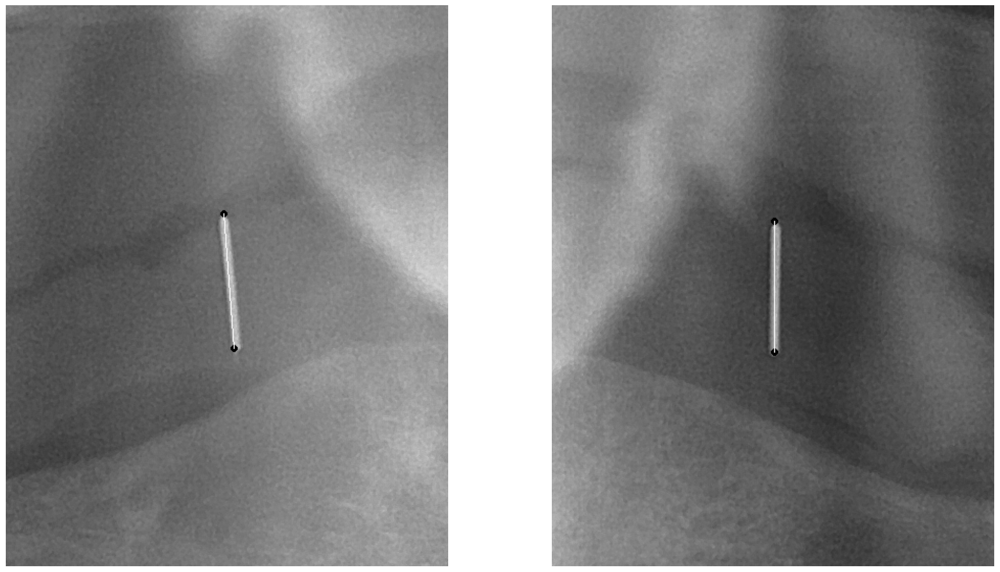

In [44]:
left_pin_img, right_pin_img = draw_pin_line(cropped_left_pin, cropped_right_pin, left_top_point, left_bottom_point, right_top_point, right_bottom_point)

display_images(left_pin_img, right_pin_img)

In [45]:
def get_pin_height(left_pin: tuple[tuple[int, int], tuple[int, int]], right_pin: tuple[tuple[int, int], tuple[int, int]]) -> tuple[float, float]:
    left_x_top, left_y_top = left_pin[0]
    left_x_bottom, left_y_bottom = left_pin[1]
    right_x_top, right_y_top = right_pin[0]
    right_x_bottom, right_y_bottom = right_pin[1]
    
    left_height = np.sqrt(((left_x_bottom - left_x_top) ** 2) + ((left_y_bottom - left_y_top) ** 2))
    right_height = np.sqrt(((right_x_bottom - right_x_top) ** 2) + ((right_y_bottom - right_y_top) ** 2))
    
    return left_height, right_height

In [46]:
left_pin_height, right_pin_height = get_pin_height((left_top_point, left_bottom_point), (right_top_point, right_bottom_point))

In [47]:
def get_annotation_line(img: np.array) -> np.array:
    hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    annotation_line = cv.inRange(hsv, (10, 0, 0), (255, 255, 255))
    mask = sp.ndimage.binary_fill_holes(annotation_line)
    edges = skimage.feature.canny(mask, sigma=9)
    return edges

In [48]:
mask = get_annotation_line(img_with_annotation)

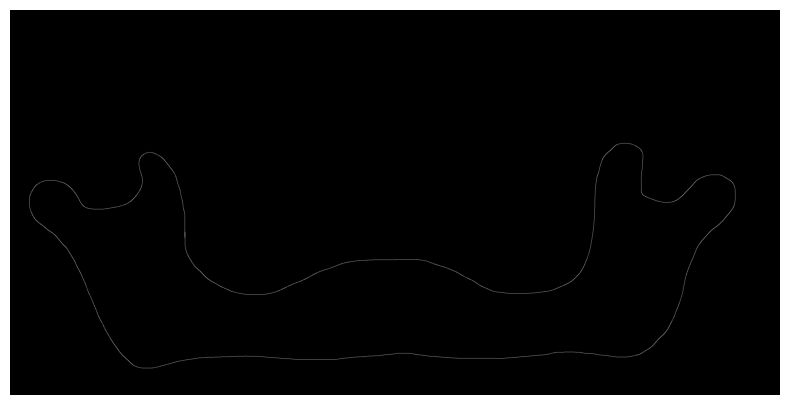

In [49]:
display_image(mask)

In [50]:
def get_snake(edges: np.array) -> tuple[list[int, int], list[int, int]]:
    top_snake = []
    bottom_snake = []
    
    top_y1 = None
    bottom_y1 = None
    
    for x in range(edges.shape[1]):
        y_points = np.argwhere(edges[:, x] > 0).flatten()
        
        if y_points.shape[0] > 0:
            top_y2 = min(y_points)
            bottom_y2 = max(y_points)
            
            top_distance = abs(top_y2 - top_y1) if top_y1 != None else 0
            bottom_distance = abs(bottom_y2 - bottom_y1) if bottom_y1 != None else 0
            
            if top_distance > 10:
                top_loop = range(top_y1, top_y2, -1) if top_y1 > top_y2 else range(top_y1, top_y2)
                
                for y in top_loop:
                    top_left_boundary = x - 10 if x - 10 >= 0 else 0
                    
                    x_points = np.argwhere(edges[y, :] > 0)
                    
                    if x_points.shape[0] > 0:
                        top_snake.append([min(x_points[x_points > top_left_boundary]), y])
                        
            if bottom_distance > 10:
                 bottom_loop = range(bottom_y1, bottom_y2, -1) if bottom_y1 > bottom_y2 else range(bottom_y1, bottom_y2)
                 
                 for y in bottom_loop:
                    bottom_left_boundary = x - 10 if x - 10 >= 0 else 0
                    
                    x_points = np.argwhere(edges[y, :] > 0)
                    
                    if x_points.shape[0] > 0:
                        bottom_snake.append([min(x_points[x_points > bottom_left_boundary]), y])
                        
                            
            top_y1 = min(y_points)
            bottom_y1 = max(y_points)
            
            top_snake.append([x, min(y_points)])
            bottom_snake.append([x, max(y_points)])
            
    return np.array(top_snake), np.array(bottom_snake)

In [51]:
top_snake, bottom_snake = get_snake(mask)

In [52]:
def draw_snake(snake: np.array, edges: np.array) -> None:
    img = np.zeros((edges.shape[0], edges.shape[1]))
    
    for i in range(snake.shape[0]):
        cv.circle(img, snake[i], 1, (255, 255, 0), 1)
    
    display_images(img, edges)

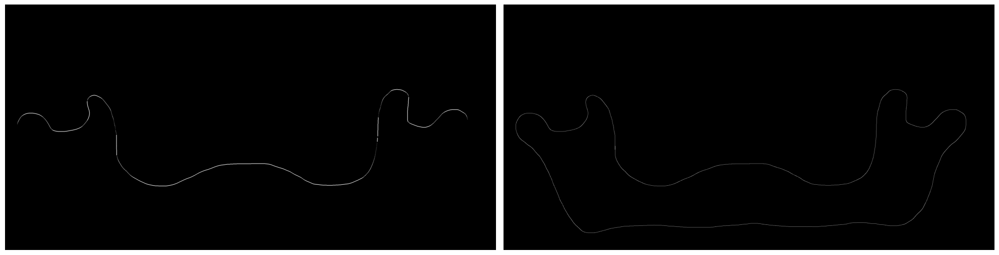

In [53]:
draw_snake(top_snake, mask)

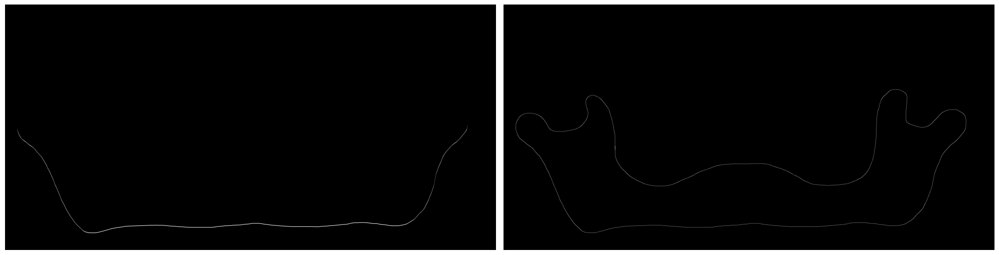

In [54]:
draw_snake(bottom_snake, mask)

In [55]:
def get_mandible_height(top_snake: np.array, bottom_snake: np.array) -> float:
    img = img_pred.copy()
    
    min_y = min(top_snake.T[1])
    max_y = max(bottom_snake.T[1])
    
    top_boundary = round(min_y + (max_y - min_y) * 0.45)
    
    min_height = None
    
    p1_x, p1_y = (0, 0)
    p2_x, p2_y = (0, 0)
    
    for (x1, y1) in top_snake:
        if y1 >= top_boundary:
            i = 0
            for (x2, y2) in bottom_snake:
                i += 1
                height = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
                
                if min_height == None or min_height > height:
                    min_height = height
                    p1_x, p2_x, p1_y, p2_y = x1, x2, y1, y2
                    
    measure_side = "right" if p1_x > img.shape[0] // 2 else "left"
                
    cv.line(img, (p1_x, p1_y), (p2_x, p2_y), (255, 255, 0), 2)
    
    display_images(img, img_with_annotation)
    
    return min_height, measure_side

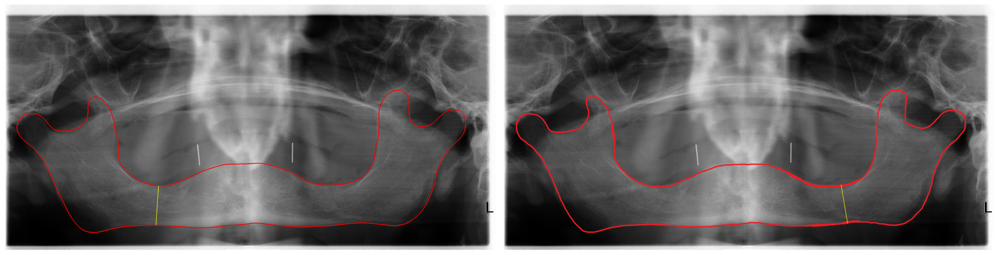

In [56]:
mandible_height_px, mandible_height_side = get_mandible_height(top_snake, bottom_snake)

In [57]:
def convert_measurement(mandible_height_px, pin_height):
    return (mandible_height_px / pin_height) * 10

In [58]:
left_pin_height, right_pin_height

(132.3782459469833, 125.0)

In [59]:
pin_height = left_pin_height if mandible_height_side == "left" else right_pin_height

mandible_height_mm = convert_measurement(mandible_height_px, pin_height)

In [60]:
mandible_height_mm

19.641751449399823

In [61]:
percent_error_1 = (mandible_height_mm - df.loc[df["X-ray Number"] == f"#{case_numbers[image_index]}"]["Mandible height 1st measurement"]) / df.loc[df["X-ray Number"] == f"#{case_numbers[image_index]}"]["Mandible height 1st measurement"]
percent_error_2 = (mandible_height_mm - df.loc[df["X-ray Number"] == f"#{case_numbers[image_index]}"]["Mandible height 2nd measurement"]) / df.loc[df["X-ray Number"] == f"#{case_numbers[image_index]}"]["Mandible height 2nd measurement"]
percent_error_3 = (mandible_height_mm - df.loc[df["X-ray Number"] == f"#{case_numbers[image_index]}"]["Mandible height 3rd measurement"]) / df.loc[df["X-ray Number"] == f"#{case_numbers[image_index]}"]["Mandible height 3rd measurement"]

avg_percent_error = abs((percent_error_1 + percent_error_2 + percent_error_3) / 3)
avg_percent_error

5    0.046552
dtype: float64

In [62]:
df.loc[df["X-ray Number"] == f"#{case_numbers[image_index]}"]

,X-ray Number,Mandible height 1st measurement,Mandible height 2nd measurement,Mandible height 3rd measurement,Type of mandible height,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8
5,#0104607,19.04,18.65,18.62,2,NaN,NaN,NaN,NaN
